In [1]:
import theano
theano.config.gcc.cxxflags = "-Wno-c++11-narrowing"

In [2]:
import pickle

import holoviews as hv
import nevergrad as ng
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as tt
import xarray as xr

In [5]:
%load_ext autoreload
%autoreload 1
%aimport seir.simple_eir

In [3]:
hv.notebook_extension('bokeh', logo=False)

In [ ]:
ds = seir.simple_eir.ds
ds['']

In [84]:
with open('seir/tmp_best.pkl', 'rb') as f:
    kwargs = pickle.load(f)

print(seir.simple_eir.transform(**{k: np.average(v) for k, v in kwargs.items()}))
print([np.average(v) for v in seir.simple_eir.transform(**kwargs)])

exposed, infectious, detected, recovered, dead = seir.simple_eir.ode(
    *seir.simple_eir.transform(**kwargs)
)

# Holoviews handles NaN better than inf
exposed[np.isinf(exposed)] = np.nan
infectious[np.isinf(infectious)] = np.nan
detected[np.isinf(detected)] = np.nan
recovered[np.isinf(recovered)] = np.nan
dead[np.isinf(dead)] = np.nan

hv.HoloMap({
    (seir.simple_eir.region_names[region_i], variable):
    hv.Curve((seir.simple_eir.ds['data'].values, data[region_i, :]), 'Date', 'Count', label='exposed')
    * (hv.Scatter(seir.simple_eir.ds.isel(denominazione_regione=region_i), 'data', ds_name)
       if ds_name is not None else hv.Scatter(([], [])))
    for region_i in [8, 20]
    for variable, data, ds_name in [
        ('exposed', exposed, None),
        ('infectious', infectious, None),
        ('detected', detected, 'totale_positivi'),
        ('recovered', recovered, 'dimessi_guariti'),
        ('dead', dead, 'deceduti'),
    ]
}, ['Region', 'Variable']).overlay('Variable').options(aspect=3, responsive=True).layout().cols(1)

(330.2060307198159, 46.47216239615133, 3.628278929003503e-20, 0.0, 0.0015053670813681423, 2.746546719564406, 0.045838269241160044, 0.12351376514587666, 0.046313568786415994)
[20229.40592121785, 1925.3092114812112, 10.539037267411663, 0.4, 0.0015053670813681423, 37.58675326852666, 0.045838269241160044, 0.12351376514587666, 2.1979636253465324]


:NdLayout   [Region]
   :NdOverlay   [Variable]
      :Overlay
         .Curve.Exposed :Curve   [Date]   (Count)
         .Scatter.I     :Scatter   [data]   (dimessi_guariti)

In [82]:
(
    hv.HoloMap({
        (seir.simple_eir.region_names[region_i], variable):
        hv.Curve((seir.simple_eir.ds['data'].values, data[region_i, :]), 'Date', 'Count', label='exposed')
        * (hv.Scatter(seir.simple_eir.ds.isel(denominazione_regione=region_i), 'data', ds_name)
           if ds_name is not None else hv.Scatter(([], [])))
        for region_i in range(n_regions)
        for variable, data, ds_name in [
            ('exposed', exposed, None),
            ('infectious', infectious, None),
            ('detected', detected, 'totale_positivi'),
            ('recovered', recovered, 'dimessi_guariti'),
            ('dead', dead, 'deceduti'),
        ]
    }, ['Region', 'Variable']).overlay('Variable')
    .options(aspect=3, responsive=True, legend_position='right')
    .layout().cols(1)
)

:NdLayout   [Region]
   :NdOverlay   [Variable]
      :Overlay
         .Curve.Exposed :Curve   [Date]   (Count)
         .Scatter.I     :Scatter   [data]   (dimessi_guariti)

In [ ]:
(initial_exposed, initial_infectious, beta, beta_detected_ratio,
 sigma, theta, gamma_mu, gamma_detected, mu_detected) = seir.simple_eir.transform(**kwargs)

exposed, infectious, detected, recovered, dead = seir.simple_eir.ode(
    initial_exposed, initial_infectious, beta, beta_detected_ratio,
    sigma, theta, gamma_mu, gamma_detected, mu_detected
)

assert np.all(np.isfinite(exposed))
assert np.all(np.isfinite(infectious))
assert np.all(np.isfinite(detected))
assert np.all(np.isfinite(recovered))
assert np.all(np.isfinite(dead))

print((theta * seir.simple_eir.ds['tamponi'].values[:, :-1] / 1e6).max())

n_regions = len(seir.simple_eir.ds['denominazione_regione'])
n_time = len(seir.simple_eir.ds['data'])

SD = 3

with pm.Model() as model:
    
#     exposed = pm.Lognormal('exposed', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['totale_positivi'].values+1)
#     infectious = pm.Lognormal('infectious', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['totale_positivi'].values+1)
#     detected = pm.Lognormal('detected', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['totale_positivi'].values+1)
#     recovered = pm.Lognormal('recovered', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['dimessi_guariti'].values+1)
#     dead = pm.Lognormal('dead', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['deceduti'].values+1)

#     exposed = pm.Lognormal('exposed', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['totale_positivi'].values+1000)
#     infectious = pm.Lognormal('infectious', mu=np.log(100), sd=3, shape=(n_regions, n_time),
#                         testval=ds['totale_positivi'].values+1)


    exposed = pm.Lognormal('exposed', mu=np.log(100), sd=3, shape=(n_regions, n_time),
                        testval=exposed)
    infectious = pm.Lognormal('infectious', mu=np.log(100), sd=3, shape=(n_regions, n_time),
                        testval=infectious)
    
    noise = pm.Normal('detected_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['totale_positivi'].values
    sd = np.sqrt(10 ** 2 + 0.05 ** 2 * mu * mu)
    detected = pm.Deterministic('detected', mu + sd * noise)
    
    noise = pm.Normal('recovered_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['dimessi_guariti'].values
    sd = np.sqrt(10 ** 2 + 0.05 ** 2 * mu * mu)
    recovered = pm.Deterministic('recovered', mu + sd * noise)
    
    noise = pm.Normal('dead_noise', 0, 1, shape=(n_regions, n_time))
    mu = seir.simple_eir.ds['deceduti'].values
    sd = np.sqrt(2 ** 2 + 0.02 ** 2 * mu * mu)
    dead = pm.Deterministic('dead', mu + sd * noise)
    
    beta = pm.Lognormal(
        name='beta',
        mu=np.log(beta),
        sd=SD,
        shape=(n_regions, seir.simple_eir.n_eras),
    )[..., seir.simple_eir.era_indices[:-1]]
    beta_detected_ratio = pm.Uniform(
        name='beta_detected_ratio',
        lower=0,
        upper=1,
        testval=beta_detected_ratio,
        shape=(n_regions, seir.simple_eir.n_eras),
    )[..., seir.simple_eir.era_indices[:-1]]
    sigma = pm.Lognormal(
        name='sigma',
#         mu=np.log(0.3),
        mu=np.log(sigma),
        sd=SD,
    )
    theta = pm.Uniform(
        name='theta',
        lower=0,
        upper=1,
        shape=(n_regions, 1),
        testval=theta,
    ) * seir.simple_eir.ds['tamponi'].values[:, :-1] / 1e6
    gamma_mu = pm.Lognormal(
        name='gamma_mu',
#         mu=np.log(0.35),
        mu=np.log(gamma_mu),
        sd=SD,
    )
    gamma_detected = pm.Lognormal(
        name='gamma_detected',
#         mu=np.log(0.008),
        mu=np.log(gamma_detected),
        sd=SD,
    )
    mu_detected = pm.Lognormal(
        name='mu_detected',
#         mu=np.log(0.005),
        mu=np.log(mu_detected),
        sd=SD,
        shape=n_regions,
    )
    
    exposed0, exposed1 = exposed[:, :-1], exposed[:, 1:]
    infectious0, infectious1 = infectious[:, :-1], infectious[:, 1:]
    detected0, detected1 = detected[:, :-1], detected[:, 1:]
    recovered0, recovered1 = recovered[:, :-1], recovered[:, 1:]
    dead0, dead1 = dead[:, :-1], dead[:, 1:]
    
    newly_exposed = beta * infectious0 + beta * beta_detected_ratio * detected0
    progressed = sigma * exposed0
    detections = theta * infectious0
    recoveries_detected = gamma_detected * detected0
    deaths_detected = mu_detected[:, None] * detected0
    
    exposed2 = exposed0 + newly_exposed - progressed
    infectious2 = infectious0 + progressed - detections - gamma_mu * infectious0
    detected2 = detected0 + detections - recoveries_detected - deaths_detected
    recovered2 = recovered0 + recoveries_detected
    dead2 = dead0 + deaths_detected
    
    def sde_potential(name, y1, y2):
        sd = np.sqrt(((1.0 ** 2) + (0.01 ** 2 * y2 * y2)))
        mu = pm.Deterministic(f'innovation_{name}', (y1-y2)/sd)
        pm.Normal(f'sde_{name}', mu=mu, sd=1, observed=0)
#         pm.Normal(f'sde_{name}', mu=y1-y2, sd=sd, observed=0)
    
    sde_potential('exposed', exposed1, exposed2)
    sde_potential('infectious', infectious1, infectious2)
    sde_potential('detected', detected1, detected2)
    sde_potential('recovered', recovered1, recovered2)
    sde_potential('dead', dead1, dead2)
    
#     def simple_obs_model(name, mu, c0=10.0, c1=0.04):
#         sd = np.sqrt(c0 ** 2 + c1 ** 2 * mu * mu)
#         pm.Normal(name=name, mu=mu, sd=sd, observed=ds[name].values)
    
#     simple_obs_model('totale_positivi', detected, 2, 0.04)
#     simple_obs_model('deceduti', dead, 2, 0.01)
#     simple_obs_model('dimessi_guariti', recovered, 10, 0.10)
    
#     max_density = pm.find_MAP(maxeval=100)

#     trace = pm.sample(1_000, tune=1_000, target_accept=0.99, compute_convergence_checks=False)
    trace = pm.sample(100, tune=100, target_accept=0.99)
#     trace = pm.sample(200, chains=2, tune=200, target_accept=0.99, step_scale=0.1,
#                       discard_tuned_samples=False, compute_convergence_checks=False)

27.232516819887017


Only 100 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu_detected, gamma_detected, gamma_mu, theta, sigma, beta_detected_ratio, beta, dead_noise, recovered_noise, detected_noise, infectious, exposed]
Sampling 4 chains, 0 divergences:   0%|          | 0/800 [00:00<?, ?draws/s]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a0c291d0>,
      dtype=object)

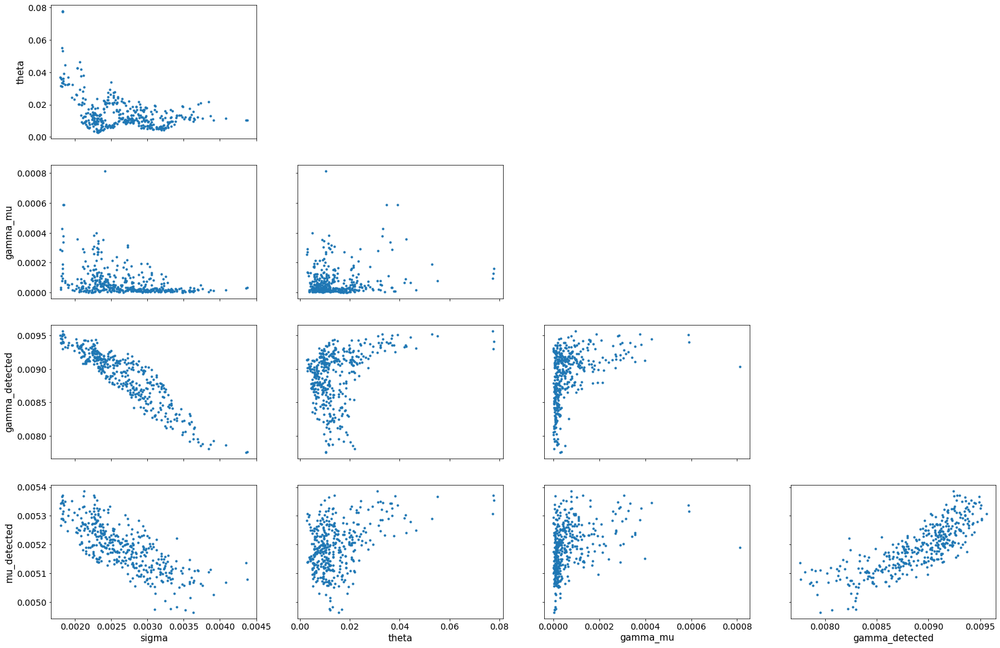

In [212]:
pm.pairplot(trace, var_names=[
    # 'beta_detected_ratio',
    'sigma',
    'theta',
    'gamma_mu',
    'gamma_detected',
    'mu_detected',
], divergences=True)

In [213]:
# pm.pairplot(trace, var_names=[
#     'beta',
# ], divergences=True)

In [214]:
k = 64
i = np.random.randint(len(trace) * trace.nchains, size=k)

In [215]:
t = np.repeat(ds['data'].values[None, :-1], k, 0).ravel()

hv.HoloMap({
    (region_names[region_i], group):
    hv.Scatter((t, trace[f'innovation_{group}'][i, region_i, :].ravel()), 'Date', 'Deviation from SEIR model')
    .options(alpha=0.1, color=color)
    for region_i, color, linecolor in [
        (9, 'blue', 'white'),
        (20, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
    for group in [
        'exposed',
        'infectious',
        'detected',
        'recovered',
        'dead',
    ]
}, ['Region', 'Variable']).overlay('Region').options(aspect=2, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Scatter   [Date]   (Deviation from SEIR model)

In [216]:
hv.HoloMap({
    region_names[region_i]: (
        hv.Overlay([
            hv.Curve((
                ds['data'], 
                trace['detected'][k, region_i, :] +
                trace['recovered'][k, region_i, :] +
                trace['dead'][k, region_i, :]
            ), 'Date', 'Total Detected Cases')
            .options(alpha=0.1, color=color)
            for k in i
        ])
        *
        hv.Scatter((ds['data'], ds['totale_casi'][region_i]))
        .options(color=color, line_color=linecolor, alpha=0.2)
    )
    for region_i, color, linecolor in [
        (9, 'blue', 'white'),
        (20, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Region']).overlay().options(aspect=5/3, responsive=True)

:NdOverlay   [Region]
   :Overlay
      .Curve.I       :Curve   [Date]   (Total Detected Cases)
      .Curve.II      :Curve   [Date]   (Total Detected Cases)
      .Curve.III     :Curve   [Date]   (Total Detected Cases)
      .Curve.IV      :Curve   [Date]   (Total Detected Cases)
      .Curve.V       :Curve   [Date]   (Total Detected Cases)
      .Curve.VI      :Curve   [Date]   (Total Detected Cases)
      .Curve.VII     :Curve   [Date]   (Total Detected Cases)
      .Curve.VIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.IX      :Curve   [Date]   (Total Detected Cases)
      .Curve.X       :Curve   [Date]   (Total Detected Cases)
      .Curve.XI      :Curve   [Date]   (Total Detected Cases)
      .Curve.XII     :Curve   [Date]   (Total Detected Cases)
      .Curve.XIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XIV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XV      :Curve   [Date]   (Total Detected Cases)
      .Curve.XVI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XVII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XVIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XIX     :Curve   [Date]   (Total Detected Cases)
      .Curve.XX      :Curve   [Date]   (Total Detected Cases)
      .Curve.XXI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXVIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXIX    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXX     :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIV   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVI   :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXVIII :Curve   [Date]   (Total Detected Cases)
      .Curve.XXXIX   :Curve   [Date]   (Total Detected Cases)
      .Curve.XL      :Curve   [Date]   (Total Detected Cases)
      .Curve.XLI     :Curve   [Date]   (Total Detected Cases)
      .Curve.XLII    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIV    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLV     :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVI    :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVII   :Curve   [Date]   (Total Detected Cases)
      .Curve.XLVIII  :Curve   [Date]   (Total Detected Cases)
      .Curve.XLIX    :Curve   [Date]   (Total Detected Cases)
      .Curve.L       :Curve   [Date]   (Total Detected Cases)
      .Curve.LI      :Curve   [Date]   (Total Detected Cases)
      .Curve.LII     :Curve   [Date]   (Total Detected Cases)
      .Curve.LIII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LIV     :Curve   [Date]   (Total Detected Cases)
      .Curve.LV      :Curve   [Date]   (Total Detected Cases)
      .Curve.LVI     :Curve   [Date]   (Total Detected Cases)
      .Curve.LVII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LVIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.LIX     :Curve   [Date]   (Total Detected Cases)
      .Curve.LX      :Curve   [Date]   (Total Detected Cases)
      .Curve.LXI     :Curve   [Date]   (Total Detected Cases)
      .Curve.LXII    :Curve   [Date]   (Total Detected Cases)
      .Curve.LXIII   :Curve   [Date]   (Total Detected Cases)
      .Curve.LXIV    :Curve   [Date]   (Total Detected Cases

In [217]:
hv.HoloMap({
    (ylabel, region_names[region_i]): (
        hv.Overlay([
            hv.Curve((ds['data'], trace[tracename][k, region_i, :]), 'Date', ylabel)
            .options(alpha=0.1, color=color)
            for k in i
        ])
        *
        hv.Scatter((ds['data'], ds[dsname][region_i]))
        .options(color=color, line_color=linecolor, alpha=0.2)
    )
    for tracename, ylabel, dsname in [
        ('detected', 'Detected Cases', 'totale_positivi'),
        ('recovered', 'Recovered Cases', 'dimessi_guariti'),
        ('dead', 'Deaths', 'deceduti'),
    ]
    for region_i, color, linecolor in [
        (9, 'blue', 'white'),
        (20, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Variable', 'Region']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Overlay
         .Curve.I       :Curve   [Date]   (Recovered Cases)
         .Curve.II      :Curve   [Date]   (Recovered Cases)
         .Curve.III     :Curve   [Date]   (Recovered Cases)
         .Curve.IV      :Curve   [Date]   (Recovered Cases)
         .Curve.V       :Curve   [Date]   (Recovered Cases)
         .Curve.VI      :Curve   [Date]   (Recovered Cases)
         .Curve.VII     :Curve   [Date]   (Recovered Cases)
         .Curve.VIII    :Curve   [Date]   (Recovered Cases)
         .Curve.IX      :Curve   [Date]   (Recovered Cases)
         .Curve.X       :Curve   [Date]   (Recovered Cases)
         .Curve.XI      :Curve   [Date]   (Recovered Cases)
         .Curve.XII     :Curve   [Date]   (Recovered Cases)
         .Curve.XIII    :Curve   [Date]   (Recovered Cases)
         .Curve.XIV     :Curve   [Date]   (Recovered Cases)
         .Curve.XV      :Curve   [Date]   (Recovered Cases)
         .Curve.XVI     :Curve   [Date]   (Recovered Cases)
         .Curve.XVII    :Curve   [Date]   (Recovered Cases)
         .Curve.XVIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XIX     :Curve   [Date]   (Recovered Cases)
         .Curve.XX      :Curve   [Date]   (Recovered Cases)
         .Curve.XXI     :Curve   [Date]   (Recovered Cases)
         .Curve.XXII    :Curve   [Date]   (Recovered Cases)
         .Curve.XXIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXIV    :Curve   [Date]   (Recovered Cases)
         .Curve.XXV     :Curve   [Date]   (Recovered Cases)
         .Curve.XXVI    :Curve   [Date]   (Recovered Cases)
         .Curve.XXVII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXVIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXIX    :Curve   [Date]   (Recovered Cases)
         .Curve.XXX     :Curve   [Date]   (Recovered Cases)
         .Curve.XXXI    :Curve   [Date]   (Recovered Cases)
         .Curve.XXXII   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIV   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXV    :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVI   :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVII  :Curve   [Date]   (Recovered Cases)
         .Curve.XXXVIII :Curve   [Date]   (Recovered Cases)
         .Curve.XXXIX   :Curve   [Date]   (Recovered Cases)
         .Curve.XL      :Curve   [Date]   (Recovered Cases)
         .Curve.XLI     :Curve   [Date]   (Recovered Cases)
         .Curve.XLII    :Curve   [Date]   (Recovered Cases)
         .Curve.XLIII   :Curve   [Date]   (Recovered Cases)
         .Curve.XLIV    :Curve   [Date]   (Recovered Cases)
         .Curve.XLV     :Curve   [Date]   (Recovered Cases)
         .Curve.XLVI    :Curve   [Date]   (Recovered Cases)
         .Curve.XLVII   :Curve   [Date]   (Recovered Cases)
         .Curve.XLVIII  :Curve   [Date]   (Recovered Cases)
         .Curve.XLIX    :Curve   [Date]   (Recovered Cases)
         .Curve.L       :Curve   [Date]   (Recovered Cases)
         .Curve.LI      :Curve   [Date]   (Recovered Cases)
         .Curve.LII     :Curve   [Date]   (Recovered Cases)
         .Curve.LIII    :Curve   [Date]   (Recovered Cases)
         .Curve.LIV     :Curve   [Date]   (Recovered Cases)
         .Curve.LV      :Curve   [Date]   (Recovered Cases)
         .Curve.LVI     :Curve   [Date]   (Recovered Cases)
         .Curve.LVII    :Curve   [Date]   (Recovered Cases)
         .Curve.LVIII   :Curve   [Date]   (Recovered Cases)
         .Curve.LIX     :Curve   [Date]   (Recovered Cases)
         .Curve.LX      :Curve   [Date]   (Recovered Cases)
         .Curve.LXI     :Curve   [Date]   (Recovered Cases)
         .Curve.LXII    :Curve   [Date]   (Recovered Cases)
         .Curve.LXIII   :Curve   [Date]   (Recovered Cases)
         .Curve.LXIV    :Curve   [Date]   (Recovered Cases)
         .Scatter.I     :Scatter   [x]   (y)

In [218]:
hv.HoloMap({
    (ylabel, region_names[region_i]): (
        hv.Overlay([
            hv.Curve((ds['data'], trace[tracename][k, region_i, :]), 'Date', ylabel)
            .options(alpha=0.1, color=color)
            for k in i
        ])
    )
    for tracename, ylabel in [
        ('exposed', 'Exposed'),
        ('infectious', 'Infectious'),
    ]
    for region_i, color, linecolor in [
        (9, 'blue', 'white'),
        (20, 'red', 'black'),
        (0, 'green', 'yellow'),
    ]
}, ['Variable', 'Region']).overlay('Region').options(aspect=3, responsive=True).layout().cols(1)

:NdLayout   [Variable]
   :NdOverlay   [Region]
      :Overlay
         .Curve.I       :Curve   [Date]   (Infectious)
         .Curve.II      :Curve   [Date]   (Infectious)
         .Curve.III     :Curve   [Date]   (Infectious)
         .Curve.IV      :Curve   [Date]   (Infectious)
         .Curve.V       :Curve   [Date]   (Infectious)
         .Curve.VI      :Curve   [Date]   (Infectious)
         .Curve.VII     :Curve   [Date]   (Infectious)
         .Curve.VIII    :Curve   [Date]   (Infectious)
         .Curve.IX      :Curve   [Date]   (Infectious)
         .Curve.X       :Curve   [Date]   (Infectious)
         .Curve.XI      :Curve   [Date]   (Infectious)
         .Curve.XII     :Curve   [Date]   (Infectious)
         .Curve.XIII    :Curve   [Date]   (Infectious)
         .Curve.XIV     :Curve   [Date]   (Infectious)
         .Curve.XV      :Curve   [Date]   (Infectious)
         .Curve.XVI     :Curve   [Date]   (Infectious)
         .Curve.XVII    :Curve   [Date]   (Infectious)
         .Curve.XVIII   :Curve   [Date]   (Infectious)
         .Curve.XIX     :Curve   [Date]   (Infectious)
         .Curve.XX      :Curve   [Date]   (Infectious)
         .Curve.XXI     :Curve   [Date]   (Infectious)
         .Curve.XXII    :Curve   [Date]   (Infectious)
         .Curve.XXIII   :Curve   [Date]   (Infectious)
         .Curve.XXIV    :Curve   [Date]   (Infectious)
         .Curve.XXV     :Curve   [Date]   (Infectious)
         .Curve.XXVI    :Curve   [Date]   (Infectious)
         .Curve.XXVII   :Curve   [Date]   (Infectious)
         .Curve.XXVIII  :Curve   [Date]   (Infectious)
         .Curve.XXIX    :Curve   [Date]   (Infectious)
         .Curve.XXX     :Curve   [Date]   (Infectious)
         .Curve.XXXI    :Curve   [Date]   (Infectious)
         .Curve.XXXII   :Curve   [Date]   (Infectious)
         .Curve.XXXIII  :Curve   [Date]   (Infectious)
         .Curve.XXXIV   :Curve   [Date]   (Infectious)
         .Curve.XXXV    :Curve   [Date]   (Infectious)
         .Curve.XXXVI   :Curve   [Date]   (Infectious)
         .Curve.XXXVII  :Curve   [Date]   (Infectious)
         .Curve.XXXVIII :Curve   [Date]   (Infectious)
         .Curve.XXXIX   :Curve   [Date]   (Infectious)
         .Curve.XL      :Curve   [Date]   (Infectious)
         .Curve.XLI     :Curve   [Date]   (Infectious)
         .Curve.XLII    :Curve   [Date]   (Infectious)
         .Curve.XLIII   :Curve   [Date]   (Infectious)
         .Curve.XLIV    :Curve   [Date]   (Infectious)
         .Curve.XLV     :Curve   [Date]   (Infectious)
         .Curve.XLVI    :Curve   [Date]   (Infectious)
         .Curve.XLVII   :Curve   [Date]   (Infectious)
         .Curve.XLVIII  :Curve   [Date]   (Infectious)
         .Curve.XLIX    :Curve   [Date]   (Infectious)
         .Curve.L       :Curve   [Date]   (Infectious)
         .Curve.LI      :Curve   [Date]   (Infectious)
         .Curve.LII     :Curve   [Date]   (Infectious)
         .Curve.LIII    :Curve   [Date]   (Infectious)
         .Curve.LIV     :Curve   [Date]   (Infectious)
         .Curve.LV      :Curve   [Date]   (Infectious)
         .Curve.LVI     :Curve   [Date]   (Infectious)
         .Curve.LVII    :Curve   [Date]   (Infectious)
         .Curve.LVIII   :Curve   [Date]   (Infectious)
         .Curve.LIX     :Curve   [Date]   (Infectious)
         .Curve.LX      :Curve   [Date]   (Infectious)
         .Curve.LXI     :Curve   [Date]   (Infectious)
         .Curve.LXII    :Curve   [Date]   (Infectious)
         .Curve.LXIII   :Curve   [Date]   (Infectious)
         .Curve.LXIV    :Curve   [Date]   (Infectious)